In [1]:
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from scipy.sparse import coo_matrix, csr_matrix
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing  

Напишем функции для визуализации рекомендаций 

In [2]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=3, loc = None, avr_rate = None):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(30, 5))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i) # получаем доступ к картинке по url
                im = Image.open(BytesIO(r.content)) # открываем обложку книги

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.set_title("measure = {}, \n".format(np.round(measure[cnt], 4))
                                 +interactions[interactions.product_id == product_ids[cnt]]['Book-Title'].values[0],
                                fontsize = 18) # выводим меру и название книги с конкретным id из interactions
            elif loc is not None:
                a.set_title(loc[idx] + '\n avr rate ='+ str(np.round(avr_rate[cnt], 2)) + '\n'+
                            interactions[interactions.product_id == product_ids[cnt]]['Book-Title'].values[0],
                                fontsize = 18) # выводим рейтинг и название книги с конкретным id из interactions
            else:
                a.set_title(interactions[interactions.product_id == product_ids[cnt]]['Book-Title'].values[0],
                                fontsize = 18) # если мера и рейтинг не заданы вывести просто название
            cnt += 1
            
            plt.imshow(im) 
            plt.axis('off')
        plt.show()

Прочитаем данные  

In [3]:
books = pd.read_csv("BX-Books.csv");
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1");
interactions = interactions[interactions["Book-Rating"] != 0]; # не будем рекомендовать книги, оценка которых 0
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1');

/home/dimsap/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [4]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [5]:
interactions.head()

,User-ID,ISBN,Book-Rating
1,276726,0155061224,5
3,276729,052165615X,3
4,276729,0521795028,6
6,276736,3257224281,8
7,276737,0600570967,6


In [6]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


Видим, что форма для локации скорее всего состояла из 3 пунктов: город, округ, страна  
Подготовим данные о локации и разделим на слова.  
Удалим юзеров с локацией состоящей больше чем из 3 слов (будем считать, что эти пользователи неверно заполнили форму) 

In [7]:
k = 0
new_loc = []
bad_index = []
for i in range(len(users.Location.values)):
    if len(re.split(",", users.Location.values[i].replace(' ', '').replace('"', ''))) != 3:
        bad_index.append(i)
    else:
        new_loc.append(re.split(",", users.Location.values[i].replace(' ', '').replace('"', '')))
users.drop(bad_index, axis = 0, inplace = True)
users.reset_index(drop=True, inplace=True)

Создадим новые фичи на основе локации  
Посмотрим на распределение возраста 

In [8]:
new_loc = np.array(new_loc)
users['city'] = new_loc[:,0]
users['district'] = new_loc[:,1]
users['country'] = new_loc[:,2]

In [9]:
users.head()

,User-ID,Location,Age,city,district,country
0,1,"nyc, new york, usa",NaN,nyc,newyork,usa
1,2,"stockton, california, usa",18.0,stockton,california,usa
2,3,"moscow, yukon territory, russia",NaN,moscow,yukonterritory,russia
3,4,"porto, v.n.gaia, portugal",17.0,porto,v.n.gaia,portugal
4,5,"farnborough, hants, united kingdom",NaN,farnborough,hants,unitedkingdom


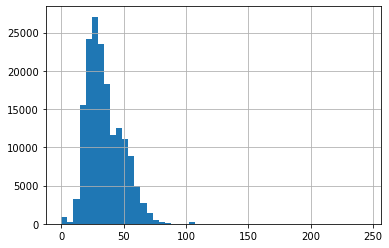

In [10]:
users.Age.hist(bins=50)

Для удобства создания личного топа выделим из пользователей только тех, кто проживает в часто встречающихся странах (пользователи из данного региона встречаются не меньше 20 раз). Для этого проверим, как много информации будет потеряно при удалении остальных пользователей)  
Также заменим возраст больше 80 на nan (будем считать, что скорее всего причина такого вораста - неверно заполненная форма)

In [11]:
print('доля пользователей, проживающих в редко встрачающихся странах',
    users.country.value_counts()[users.country.value_counts() < 20].sum()/ users.country.value_counts().sum())          

доля пользователей, проживающих в редко встрачающихся странах 0.004438467196446342


In [12]:
countrys = users.country.value_counts()[users.country.value_counts() > 20].index.tolist()
cummon_countrys = [users.country[i] in countrys for i in range(users.shape[0])]
optimal_lock_users = users[cummon_countrys]
optimal_lock_users.loc[optimal_lock_users.Age > 80, 'Age'] = np.nan 

/home/dimsap/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Посчитаем и добавим в таблицу взаимодействий, как часто пользователь и книга встретились в данных.  
Удалим совсем непопулярные и сверхпопулярные книги. Первые нам не интересны, а на вторые алгоритм будет слишком настраиваться.  
Также удалим пользователей, которые слишком редко что-то покупают.


In [13]:
books_meets = interactions.groupby("ISBN")["User-ID"].count(). \
                                                      reset_index(). \
                                                      rename(columns={"User-ID": "user_num"})

user_meets = interactions.groupby("User-ID")["ISBN"].count(). \
                                                     reset_index(). \
                                                     rename(columns={"ISBN": "books_num"})

interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

Посчитаем средний рейтинг книг

In [14]:
interactions = interactions.merge(interactions.groupby('ISBN').mean() \
                                   ['Book-Rating'], on='ISBN').rename(columns={'Book-Rating_y':'avr_rate',
                                                                               'Book-Rating_x':'Book-Rating'})

Для удобства добавим в таблицу взаимодействия информацию из других таблиц, а также перекодируем id книг и пользователей

In [15]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])

Для персонального топа создадим отдельную таблицу с пользователями из часто встречающихся стран

In [16]:
interactions_cummon_countrys = interactions.merge(optimal_lock_users, on = ['User-ID'] )
interactions.head()

,User-ID,ISBN,Book-Rating,user_num,books_num,avr_rate,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,8.833333,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,3445
1,132500,3404139178,10,8,43,8.833333,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,5248
2,66483,3404139178,10,8,83,8.833333,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,2622
3,276866,3404139178,9,8,11,8.833333,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,10887
4,106534,3404139178,6,8,6,8.833333,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,4228


# Personal top

По данным локации и возрасту будем выдавать личный топ. Основная идея - пользователи из одних и тех же стран или одной и той же возрастной группы читают похожие книги.  
Предположим, что местоположение более важный признак чем возраст. Тогда будем пытаться сначала найти похожих пользователей с похожим возрастом в данном городе, затем в областе, затем в стране. Удачным будем называть поиск, который нашел больше 15 пользователей с такими же признаками и хорошим средним рейтингом.  
Если такие не были найдены, не будем учитывать возраст и попробуем найти похожих по локации пользователей.  
Если и этого не хватило, тогда найдем пользователей похожих по возрасту.

In [17]:
class Personal_top():
    def __init__(self,users):
        self.users = users
        self.product_id_to_url = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i] = j # заполним словарь url обложки по id книги
            
    def get_rec(self, loca, age = None):
        bull_loc = self.users[['city', 'district', 'country']] == loca
        self.loca = loca
        self.age = age
        
        for i in range(3): # сначала поиск по городу, затем по округу, затем по стране
            # ищем пользователей и оцененные ими книги в заданных возрастных рамках,
            # с заданной локацией и хорошим рейтингом книг  
            top_ = self.users[bull_loc.iloc[:, i:].all(axis = 1) &
                        (self.users.Age <= age + 5) & 
                        (self.users.Age >= age - 5) &
                        (self.users.avr_rate > 7)].drop_duplicates().sort_values(['avr_rate'], ascending=False)
            if top_.shape[0] > 15: # если нашли 15 подходящих пользователей выдаем рекмендации и выходим из алгоритма
                self.print_rec(top_)
                return 

        for i in range(3): # делаем тоже самое, но уже не смотрим на возраст
            top_ = self.users[bull_loc.iloc[:, i:].all(axis = 1) &
                        (self.users.avr_rate > 7)].drop_duplicates().sort_values(['avr_rate'], ascending=False)
            if top_.shape[0] > 15: # если нашли 15 подходящих пользователей выдаем рекмендации и выходим из алгоритма
                self.print_rec(top_)
                return 
            
        # если предидущие проходы не нашли 15 подходящих пользователей, выдаем рекомендации только по возрасту 
        top_ = self.users[(self.users.Age <= age + 5) & 
                 (self.users.Age >= age - 5) & 
                 (self.users.avr_rate > 7)].drop_duplicates().sort_values(['avr_rate'], ascending=False)
        self.print_rec(top_)
        
    def print_rec(self, top_):
        rec_items = top_.product_id.values
        loc = top_.Location.values
        avr_rate = top_.avr_rate.values
        print('Для пользователя проживающего в ' + self.loca[0] + ' ' + 
                                                   self.loca[1] + ' ' +
                                                   self.loca[2] + ' и возрастом равным ' + str(self.age) +  ' рекомендовать:')
        rec_imaging([book for book in rec_items[:5]], self.product_id_to_url, loc=loc[:5], avr_rate = avr_rate)

In [18]:
PT = Personal_top(interactions_cummon_countrys)

Для пользователя проживающего в da en3gland poland и возрастом равным 50 рекомендовать:


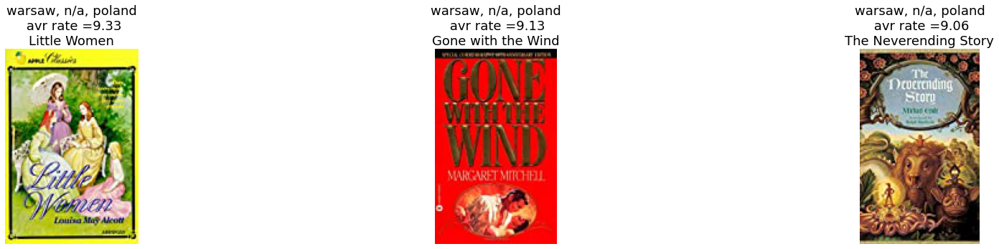

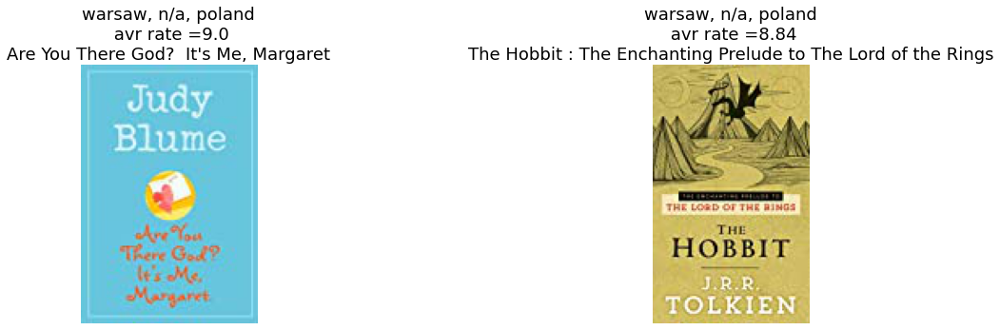

In [19]:
PT.get_rec(['da', 'en3gland', 'poland'], 50)

Рекомендации в одном городе для маленьких

Для пользователя проживающего в toronto toronto canada и возрастом равным 10 рекомендовать:


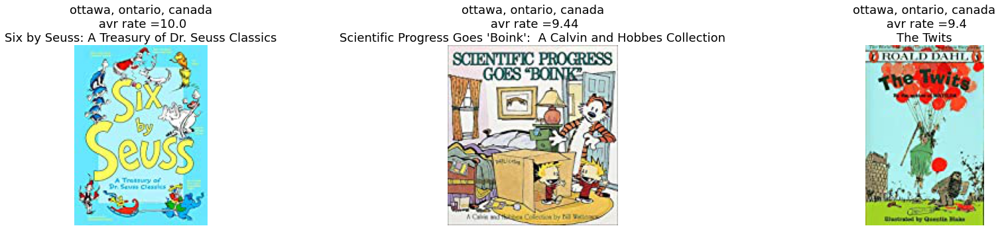

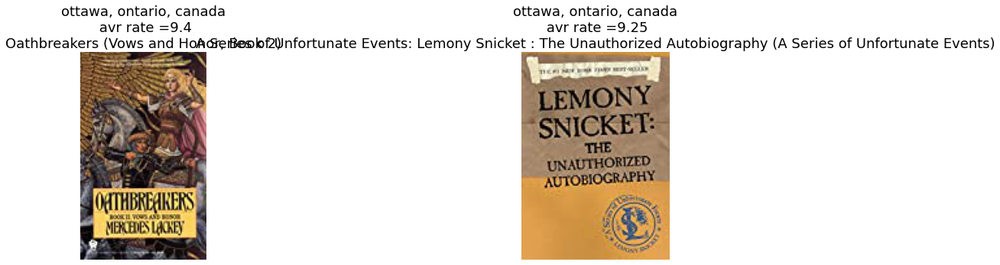

In [20]:
PT.get_rec(['toronto', 'toronto', 'canada'], 10)

И для взрослых

Для пользователя проживающего в toronto toronto canada и возрастом равным 30 рекомендовать:


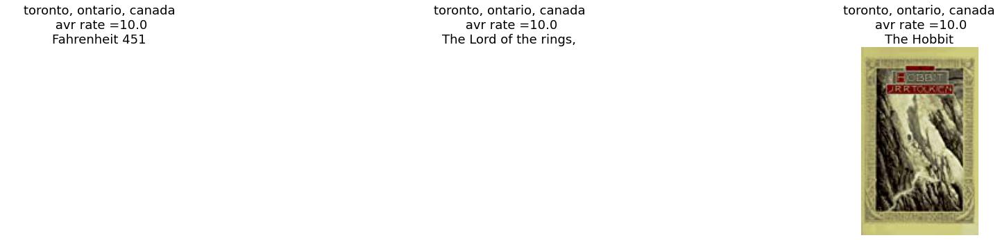

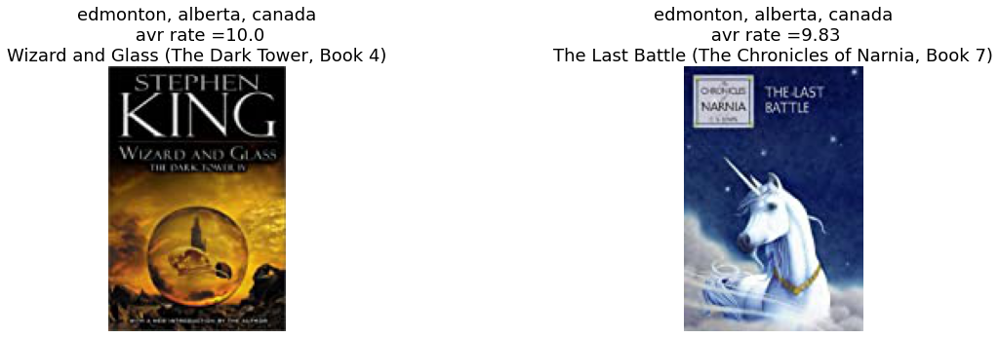

In [21]:
PT.get_rec(['toronto', 'toronto', 'canada'], 30)

# Сlustering


Будем разбивать пользователей на k кластеров использую KMeans. Пользователи - объекты кластеризации, оценки книгам - признаки.  
Внутри каждого кластера будем искать средний рейтинг книг. Для рекомендации необходимо определить к какому кластеру принадлежит пользователь и рекомендовать книги которые предпочитают в среднем пользователи в этом кластере.

In [22]:
class Cluster():
    def __init__(self, interactions, k):
        self.interactions = interactions.copy()
        # создадим матрицу совстречаемости. По строкам пользователи, по столбцам книги, на пересечении оценка юзера книге
        csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])), 
                                shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))
        self.csr_rates = csr_rates
        rates_norm = preprocessing.normalize(csr_rates)
        self.rates = rates_norm
        self.product_id_to_url = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i] = j
        
        self.k = k # k - кол-во кластеров
        
        self.interactions['avr_cluster_rate'] = 0
    def clustering(self): 
        
        
        self.model = KMeans(n_clusters = self.k)
        self.model.fit(self.rates)
        self.labels_DF = pd.DataFrame(np.hstack([np.arange(self.csr_rates.shape[0]).reshape(-1,1),
                                                 self.model.labels_.reshape(-1,1)]),
                                      columns = ['product_id','labels'])
        
        self.interactions = self.interactions.merge(self.labels_DF, on = 'product_id') # присвоим пользователю
                                                                                       # свой кластер
    def get_rec(self,idx):
        u_product_Int = self.interactions[self.interactions.vid == idx].product_id.tolist()
        label = self.labels_DF.iloc[idx].labels
        cluster_int = self.interactions[self.interactions.labels == label].copy()
        for book in cluster_int.ISBN.unique().tolist(): # рассматриваем книги, которые покупали пользователи в этом кластере
            book_interactions = cluster_int[cluster_int.ISBN == book]
            avr = book_interactions['Book-Rating'].sum()/book_interactions.shape[0] # считаем средний рейтинг книги
            cluster_int.loc[cluster_int.ISBN == book, ['avr_cluster_rate']] = avr
        # Отсортируем книги по рейтингу и будем рекомендовать топ 10 книг
        recomend = cluster_int.drop_duplicates('ISBN').sort_values(['avr_cluster_rate'], ascending=False).product_id.values
        rate = cluster_int.drop_duplicates('ISBN').sort_values(['avr_cluster_rate'], ascending=False).avr_cluster_rate.values
        self.rec = recomend
        self.clist_int = cluster_int
        
        print(u"Для пользователя купившего")
        rec_imaging(u_product_Int[:5], self.product_id_to_url) # выводим покупки пользователя
        print(u"Такие рекомендации") # выводим рекомендациихороший
        rec_imaging([book for book in recomend[:5]], self.product_id_to_url , measure= rate[:5])
        
        

In [23]:
cl = Cluster(interactions, 500)
cl.clustering()

Для пользователя купившего


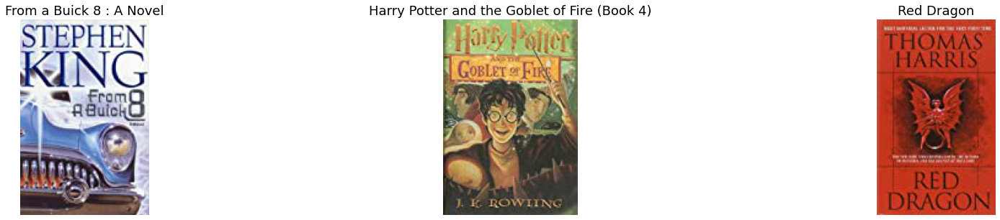

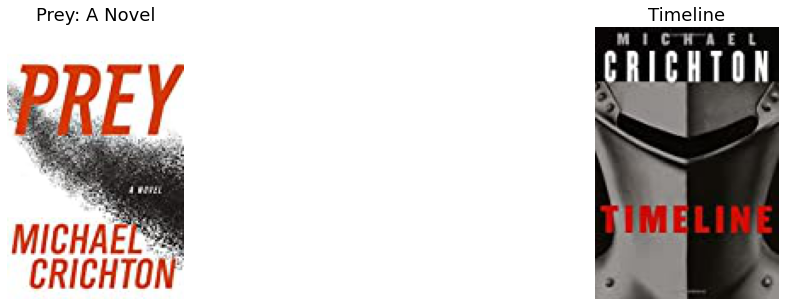

Такие рекомендации


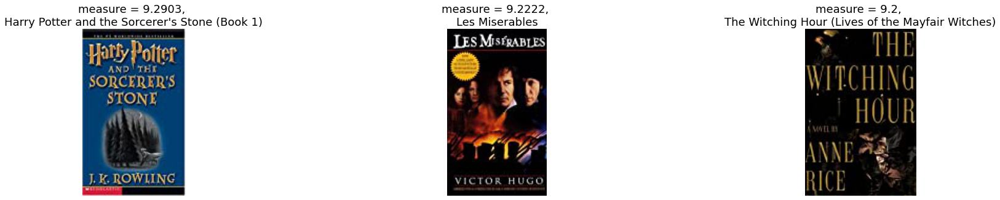

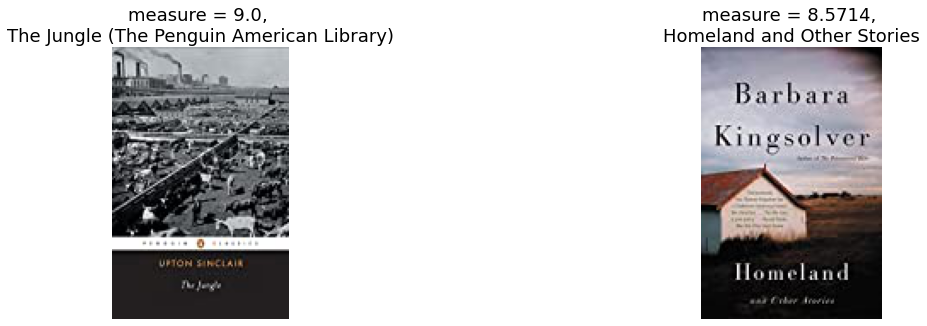

In [24]:
cl.get_rec(4234)

Для пользователя купившего


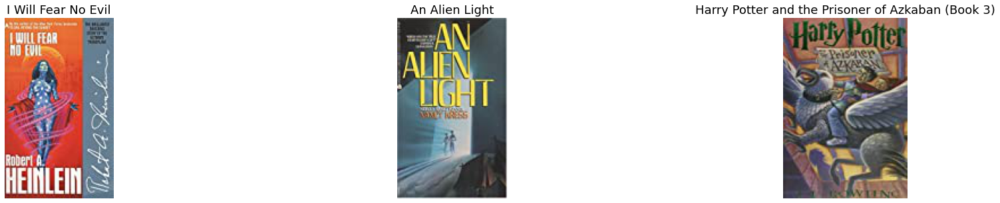

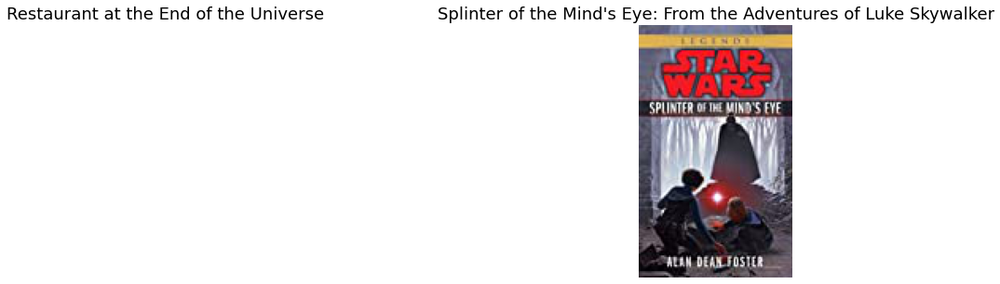

Такие рекомендации


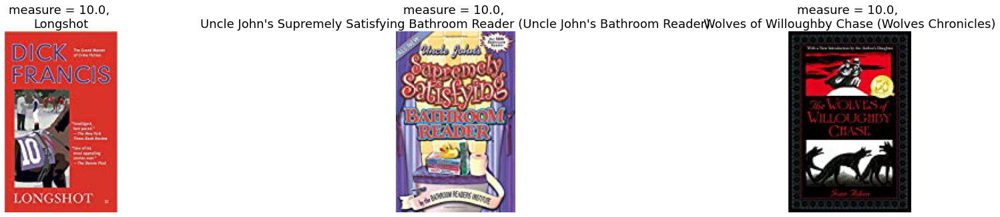

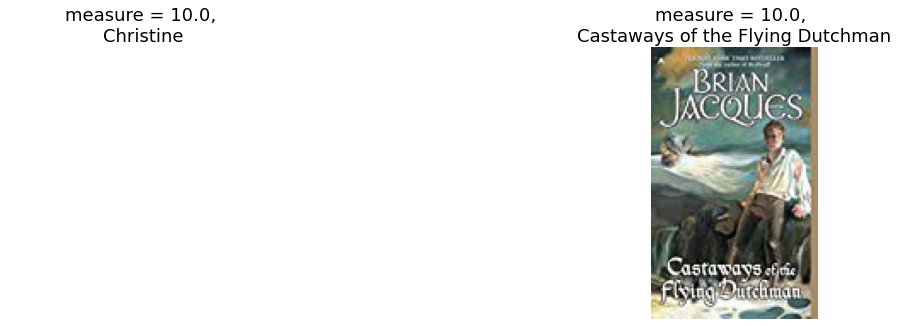

In [25]:
cl.get_rec(1916)

Видим, что рекомендации не самые лучшие, однако есть и совпадения.  
Качество можно улучшить если подобрать хороший k

# Сoocurrency

Будем рекомендовать книги на основе совстречаемости. В данном случае ркеомендация будет выдаваться для конкретной книги. Основная идея - если вместе с книгой, для которой требуется рекомендация, часто покупают конкретные книги, то можно рекмендовать их.

In [26]:
class Recomendations():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        
    def coocurrency_count(self):
        Int = self.interactions[["vid", "product_id"]].drop_duplicates()
        #ищем книги которые купил юзер и удаляем пользователей, купивших одну книгу
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index() 
        book_rate = self.interactions.drop_duplicates('product_id')[['product_id', 'avr_rate']]
        product_num = [len(i) for i in user_products["product_id"]]
        user_products["prod_num"] = product_num
        user_products = user_products[user_products["prod_num"] > 1] 
        
                                                                        
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values): # смотрим всех пользователей
            for j in range(len(i[1])): # проходим по всем книгам которые купил пользователь
                for k in range(len(i[1])):
                    if j != k:
                        try: # для двух книг у юзера прибавляем их среднюю оценку к имеющейся в словаре
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] += \
                            (book_rate[book_rate.product_id == j].avr_rate.values[0]+
                             book_rate[book_rate.product_id == k].avr_rate.values[0])/2
                        except: 
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] = 1
        cooc_list = []
        for i, j in cooc.items():
            if j != 1:
                cooc_list.append(i.split("_") + [j]) # в i содержится книга 1 и книга 2, j - рейтинг совстреч.
        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])
    
    def get_rec(self, i, show=False): # рекомендуем товары, рейтинг совстречаемости которых наибольший
        recs = self.cooc_rec[self.cooc_rec["item1"] == str(i)] \
                            .sort_values("measure", ascending=False) \
                            .head(5)
        print(u"Для товара")
        rec_imaging([i], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(recs["item2"].values.astype(int), self.product_id_to_url, 
                         recs["measure"].values.astype(int),top_n = 3)

In [27]:
coo = Recomendations(interactions)
coo.coocurrency_count()

<ipython-input-26-9c84bfae0b34>:19: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm.tqdm_notebook(user_products.values): # смотрим всех пользователей


Посмотрим на рекомендации

Для товара


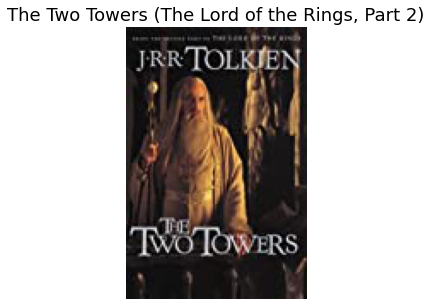

Такие рекомендации


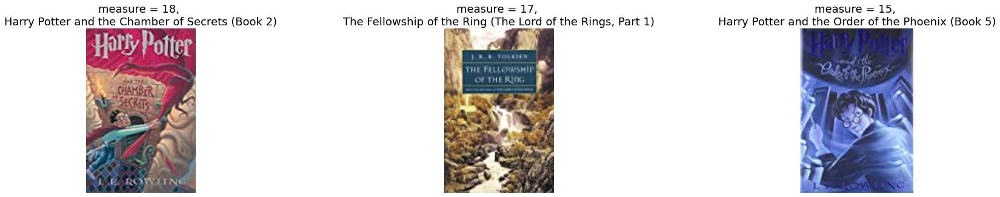

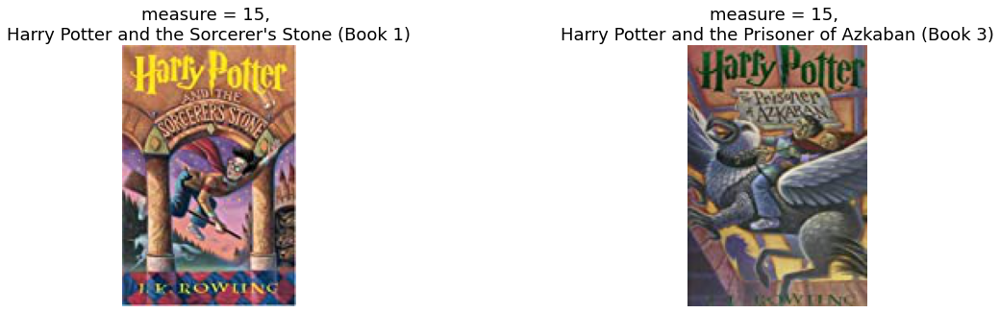

In [28]:
coo.get_rec(7174)

Для товара


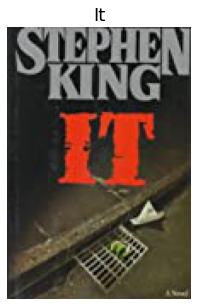

Такие рекомендации


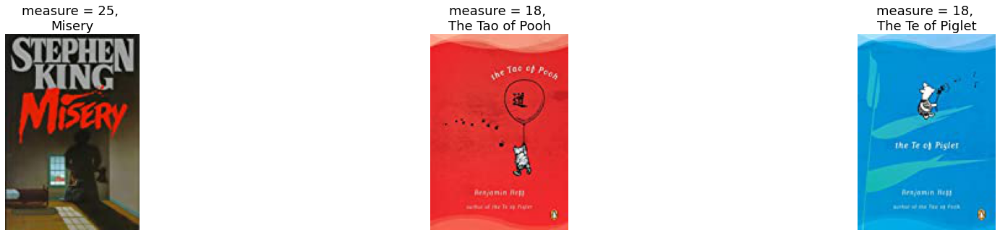

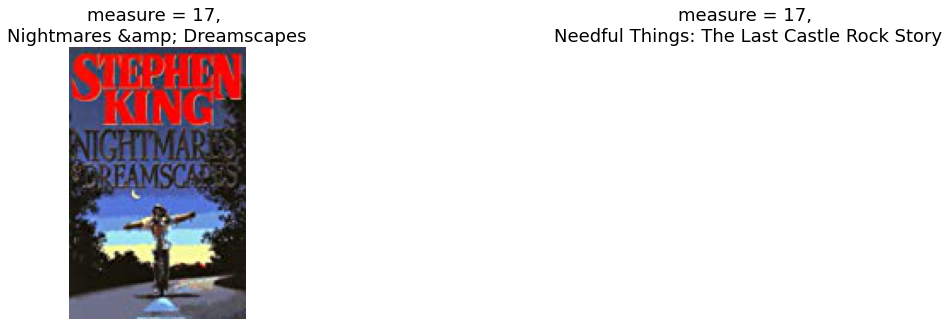

In [29]:
coo.get_rec(7216) 

Для товара


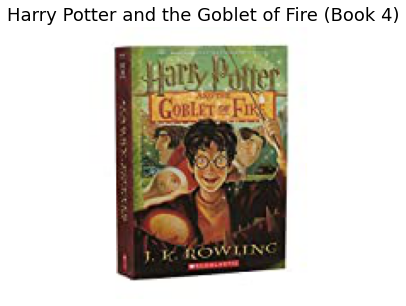

Такие рекомендации


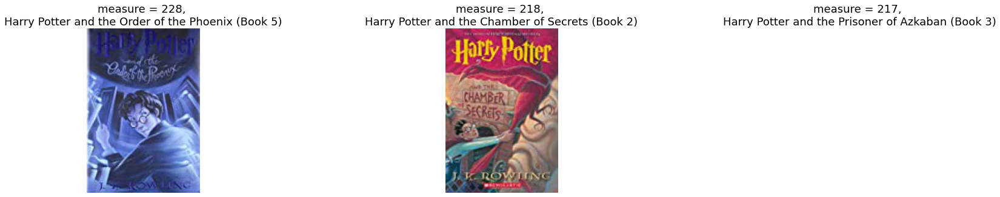

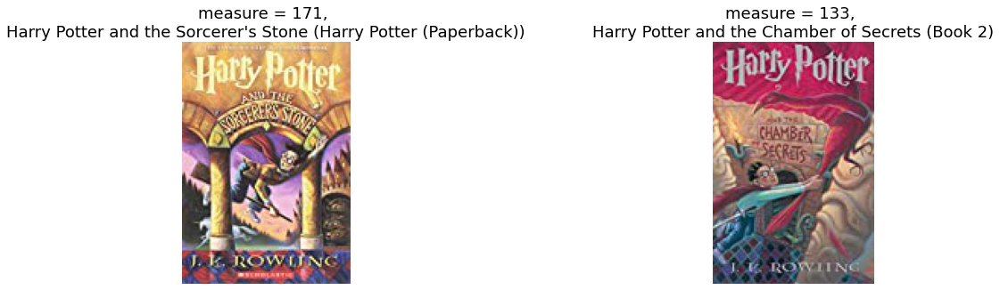

In [30]:
coo.get_rec(4227) 

Видим, что данный подход хорошо работает.

# Content_Based

Данный подход основан на следующей идеи. Можно попытаться по описанию книги (название, автор, публикация) пытаться находить похожие. Тогда можно рекомендовать как книги к книгам (I2I), так и книги конкретному пользователю (U2I). При I2I будем просто искать книги, описание которых близко по определенной метрике к описанию интересующей книги. При U2I будем искать усредненное описание товаров, которые покупал пользователь и также искать наиболее похожие книги к данному описанию.  
В качестве признаков будем использовать TFIDF названия, автора и публициста книги.  
В качестве метрики будем использовать произведение среднего рейтинга и косинусной близости книг. Таким образом будем выводить книги с хороших рейтингом.

In [31]:
class Content_Based():
    def __init__(self, items, interactions):
        items['content'] = books['Book-Title'].apply(str).values + \
                           books['Book-Author'].apply(str).values + \
                           books['Publisher'].apply(str).values 
        interactions = interactions.merge(items[['ISBN','content']], on = 'ISBN').copy()
        self.interactions = interactions
        self.product_id_to_url = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i] = j
        
    def vectorize(self):
        self.model = TfidfVectorizer()
        item_description = [re.sub("[^a-zA-Zа-яА-Я]+", " ", i.lower())
                            for i in self.interactions['content'].values]
        self.interactions['content'] = item_description
        self.model.fit(item_description)
        self.items = self.interactions.drop_duplicates('product_id')[['product_id', 'content', 'avr_rate']]\
                                                                                .sort_values('product_id')
        self.feature_items = self.model.transform(self.items.content.values)
        

        
    def get_rec_I2I(self, i_id):
        sim = cosine_similarity(self.feature_items[i_id], self.feature_items)
        avr_rates = self.items.avr_rate.values
        metrics = sim*avr_rates
        metrics[0][i_id] = 0
        print(u"Для товара")
        rec_imaging([i_id], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:5], self.product_id_to_url, np.sort(metrics)[0][::-1][1:5])


    def get_rec_U2I(self, u_id):
        u_int = self.interactions[self.interactions.vid == u_id]
        u_product_Int = u_int.product_id.tolist()

        user_content = ''
        for text in u_int['content']: # соедними описания всех книг купленных пользователем
            user_content = user_content + text
        user_vect = self.model.transform([user_content])
        
        sim = cosine_similarity(user_vect, self.feature_items)
        avr_rates = self.items.avr_rate.values
        metrics = sim*avr_rates
        
        for i in u_product_Int:
            metrics[0][i] = 0
        
        print(u"Для пользователя, который взаимодействовал с товарами")
        rec_imaging([book for book in u_product_Int[:5]], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:5], self.product_id_to_url, np.sort(metrics)[0][::-1][1:11])

In [32]:
CB = Content_Based(books, interactions)
CB.vectorize()

### I2I рекомендации

Для товара


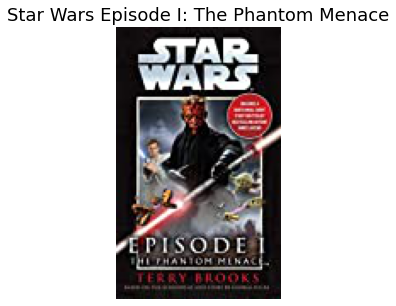

Такие рекомендации


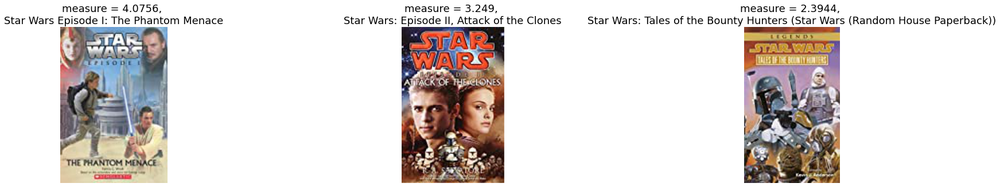

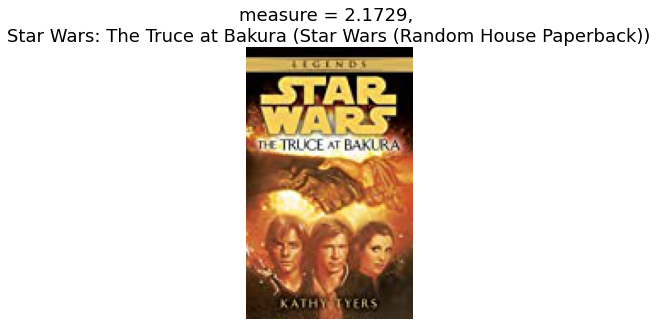

In [33]:
CB.get_rec_I2I(2233)

Для товара


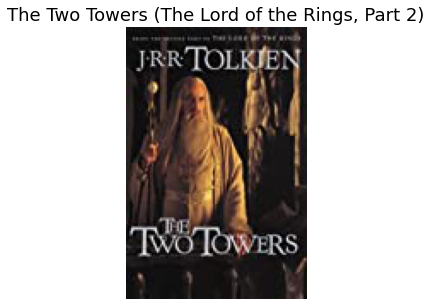

Такие рекомендации


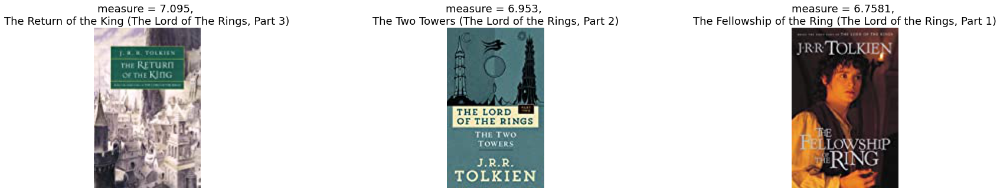

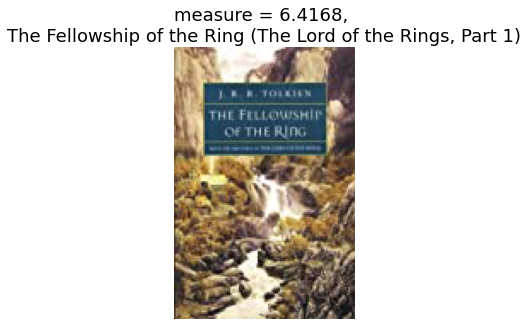

In [34]:
CB.get_rec_I2I(7174) 

Для товара


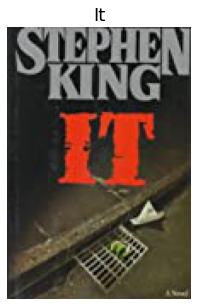

Такие рекомендации


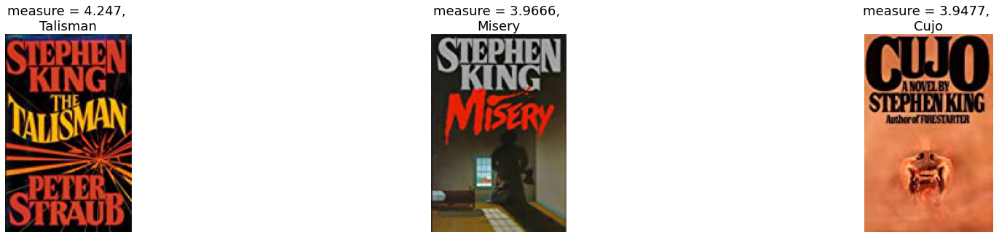

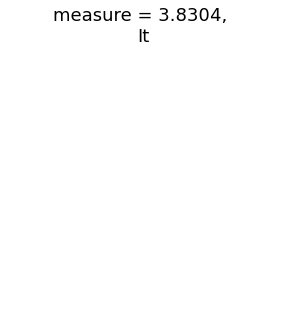

In [35]:
CB.get_rec_I2I(7216) 

Для товара


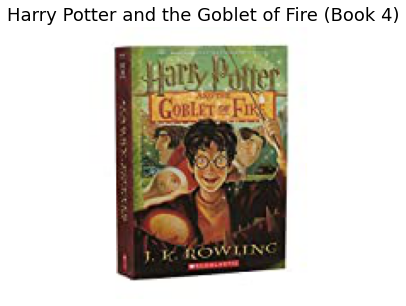

Такие рекомендации


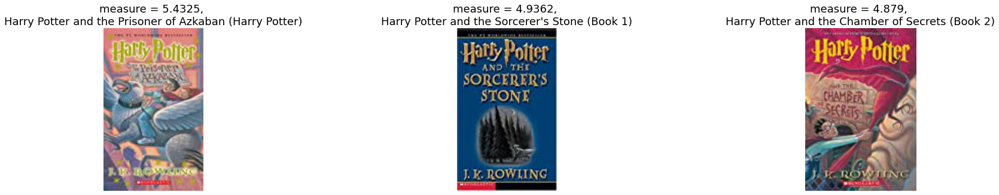

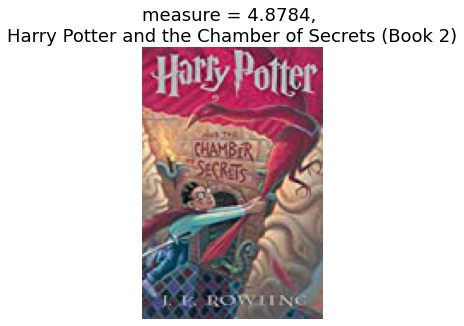

In [36]:
CB.get_rec_I2I(4227) 

### U2I рекомендации 

Для пользователя, который взаимодействовал с товарами


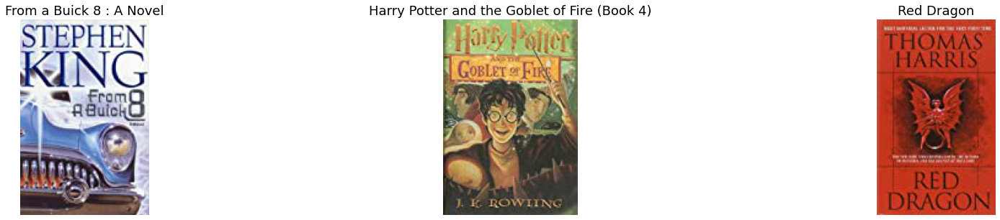

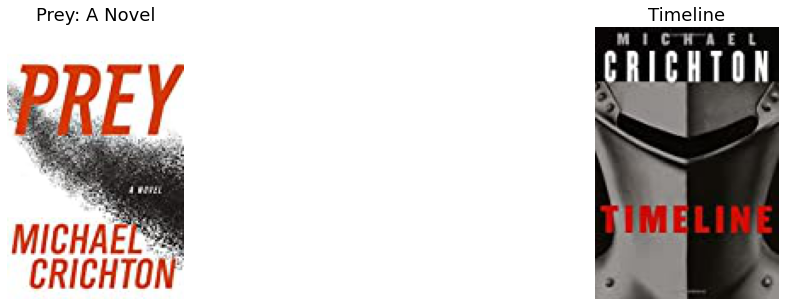

Такие рекомендации


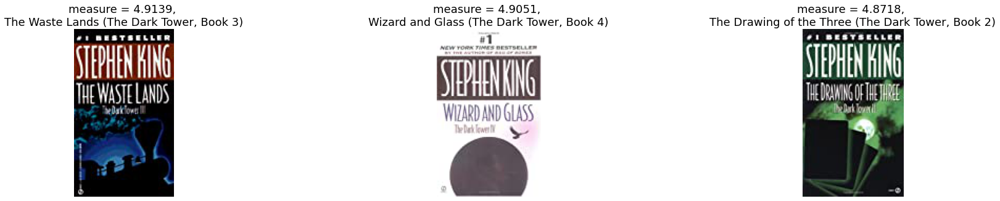

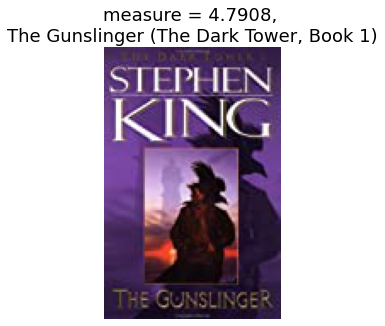

In [37]:
CB.get_rec_U2I(4234)

Для пользователя, который взаимодействовал с товарами


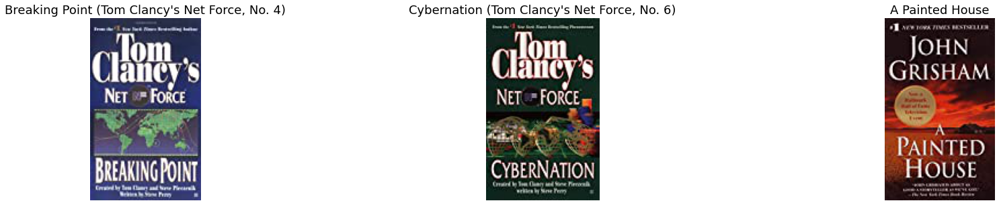

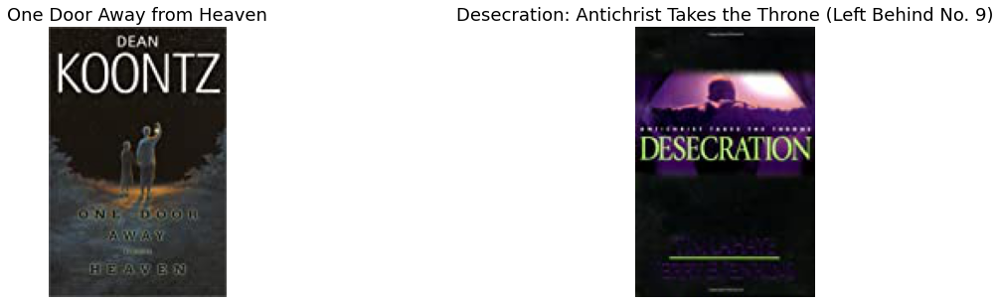

Такие рекомендации


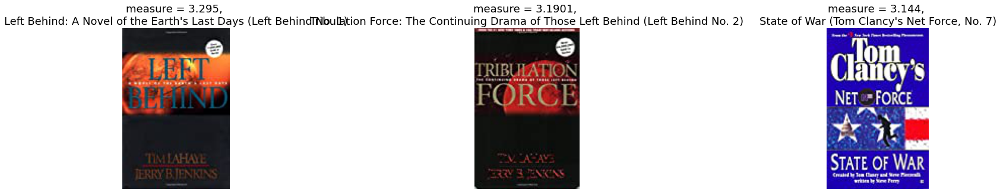

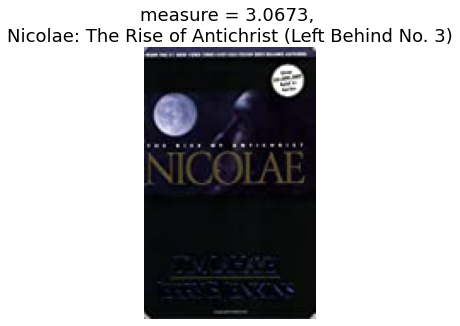

In [38]:
CB.get_rec_U2I(2676) 

Для пользователя, который взаимодействовал с товарами


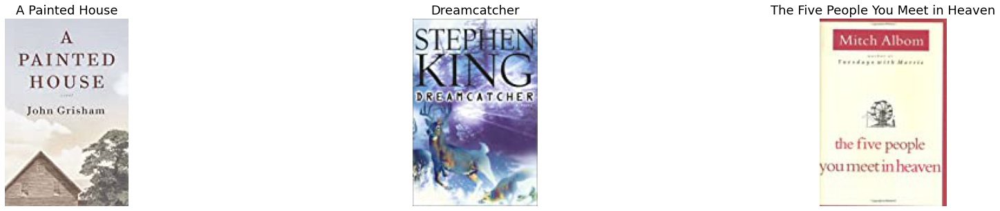

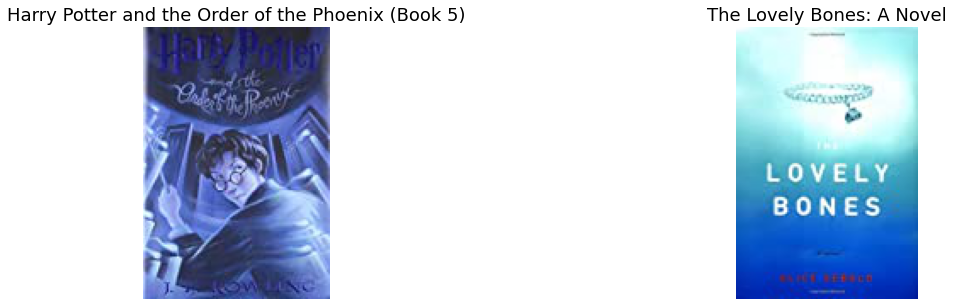

Такие рекомендации


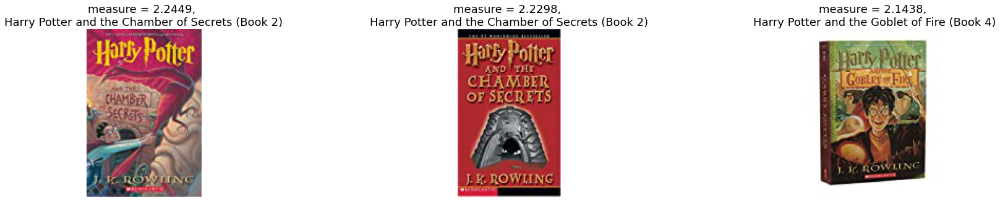

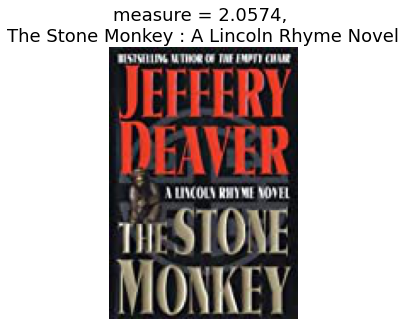

In [39]:
CB.get_rec_U2I(3012) 

Для пользователя, который взаимодействовал с товарами


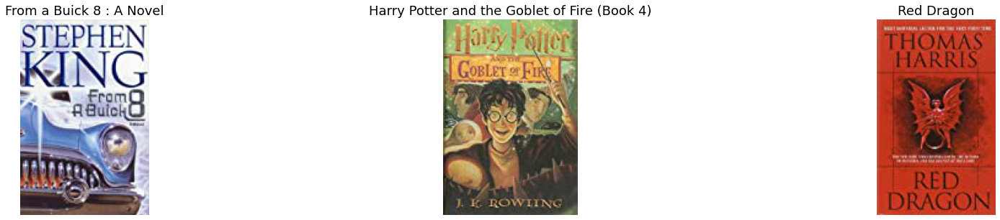

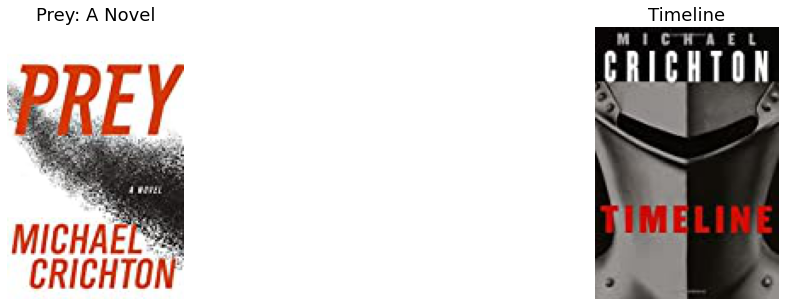

Такие рекомендации


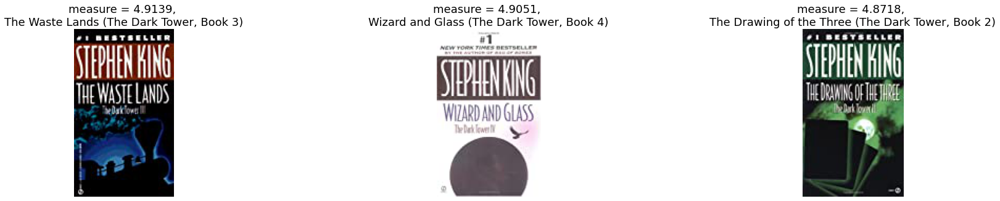

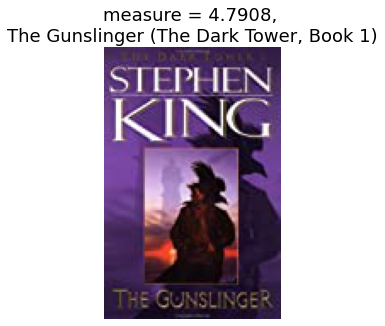

In [40]:
CB.get_rec_U2I(4234) 

Видно, что данный похдход хорошо работает. Единственная проблема - очевидные рекомендации. Скорее всего пользователь и так бы посмотрел книги того же автора. 

# Colloborative filtering

Основная идея - заполним пропуски в матрице взаимодействий опираясь на схожесть пользователя (U2I) другим пользователям или на схожесть товара (I2I) к другим товарам. Далее будем рекомендовать книги, опираясь на восстановленные рейтинги в матрице взаимодействий. 

In [41]:
class Colloborative():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        
        csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])), 
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))
        
        self.csr_rates = csr_rates.copy()
        
        self.avr_items_rate = np.array((csr_rates.sum(axis= 0)/csr_rates.getnnz(axis=0)))[0].reshape(-1,1)
        
            
        self.avr_users_rate = np.array(csr_rates.sum(axis= 1)/csr_rates.getnnz(axis=1).reshape(-1,1))
    
    def U2I(self, u_id):
        user_rates = self.csr_rates.getrow(u_id).toarray()[0]
        u_product_Int = self.interactions[self.interactions.vid == u_id].product_id.tolist()
        # находим средний рейтинг пользователя
        avg_u_rate = user_rates.sum()/len(user_rates[user_rates != 0])
        # получаем матрицу где на месте взаимодействий стоят средний рейтинги пользовтелей соответствующие строкам
        avr_matrix = csr_matrix.multiply((self.csr_rates > 0),  self.avr_users_rate)
        # найдем расстояния между пользователями
        sim = cosine_similarity(self.csr_rates.getrow(u_id), self.csr_rates).reshape(-1,1)
        # найдем рейтинги по формуле
        u_v_weight_rate = np.array(csr_matrix.multiply(self.csr_rates - avr_matrix, sim).sum(axis = 0))[0]
        recomend = [0]*self.csr_rates.shape[1]
        for i in range(len(recomend)):
            if i in u_product_Int:
                recomend[i] = 0
            else:
                recomend[i] = avg_u_rate + u_v_weight_rate[i]/sim.sum()
        self.rex = user_rates
        print(u"Для товаров")
        rec_imaging([book for book in u_product_Int[:5]], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging([book for book in np.argsort(recomend)[::-1][:5]], self.product_id_to_url,
                    np.sort(recomend)[::-1][:5])
        
    def I2I(self, i_id):
        item_rates = self.csr_rates.getcol(i_id).toarray().reshape(1, -1)[0]
        # находим средний рейтинг товара
        avg_i_rate = item_rates.sum()/len(item_rates[item_rates != 0])
        
        sim = cosine_similarity([item_rates], self.csr_rates.T).reshape(-1,1)
        # получаем матрицу где на месте взаимодействий стоят средний рейтинги товаров соответствующие столбцам
        avr_matrix = csr_matrix.multiply((self.csr_rates.T > 0),  self.avr_items_rate)
        # найдем рейтинги
        u_v_weight_rate = np.array(csr_matrix.multiply(self.csr_rates.T - avr_matrix, sim).sum(axis = 1)).reshape(-1)
        
        recomend = [0]*self.csr_rates.shape[1]
        
        for i in range(self.csr_rates.shape[1]):
            recomend[i] = avg_i_rate + u_v_weight_rate[i]#/sim.sum()
        recomend[i_id] = 0
        self.rec = recomend
        print(u"Для товаров")
        rec_imaging([i_id], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging([book for book in np.argsort(recomend)[::-1][:5]], self.product_id_to_url,
                    np.sort(recomend)[::-1][:5])
        

In [42]:
col = Colloborative(interactions)

### I2I рекомендации

Для товаров


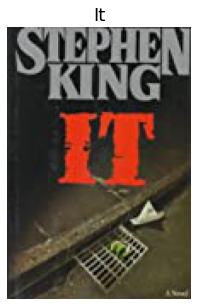

Такие рекомендации


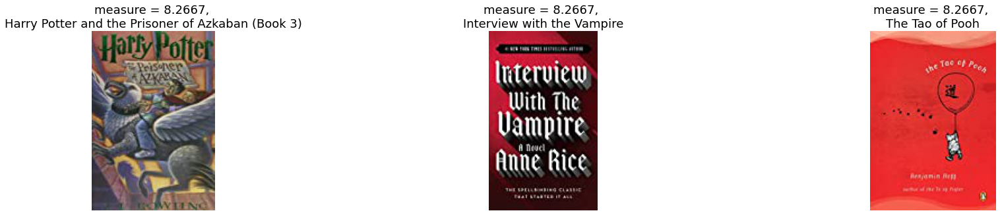

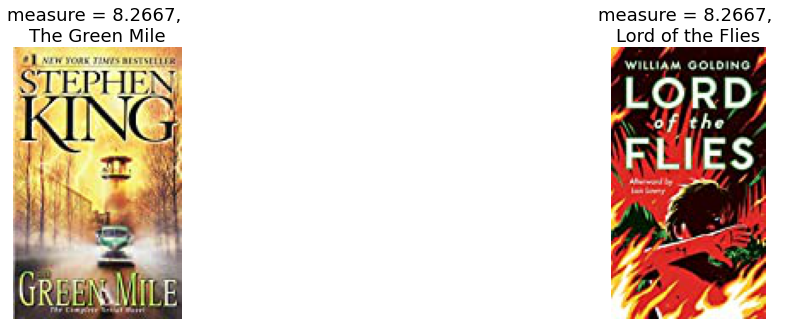

In [43]:
col.I2I(7216)

Для товаров


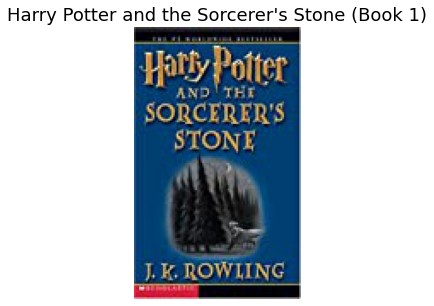

Такие рекомендации


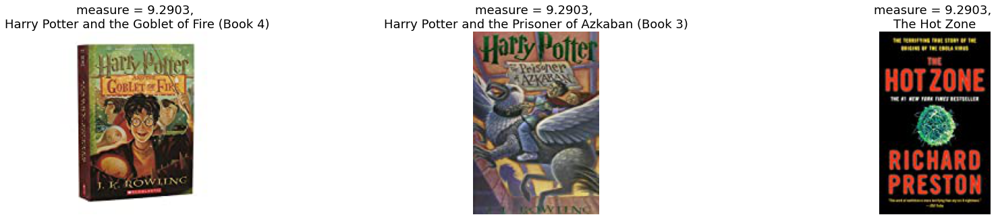

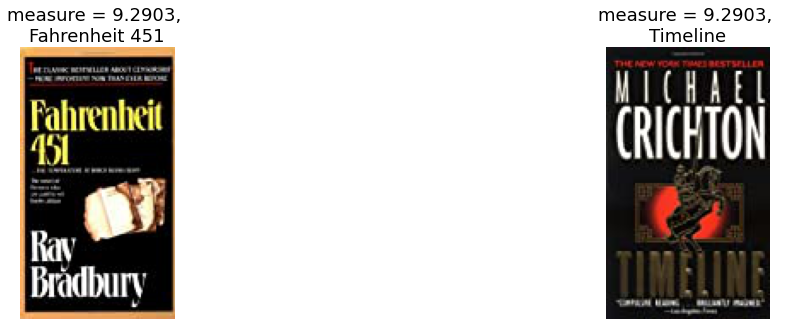

In [44]:
col.I2I(4234) 

Для товаров


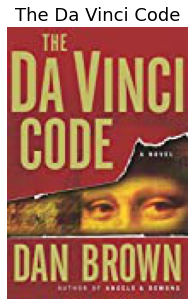

Такие рекомендации


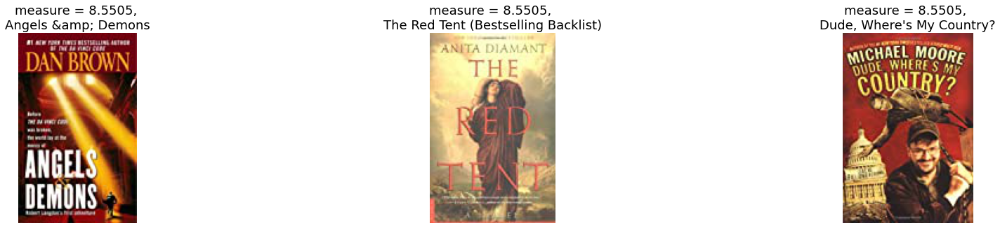

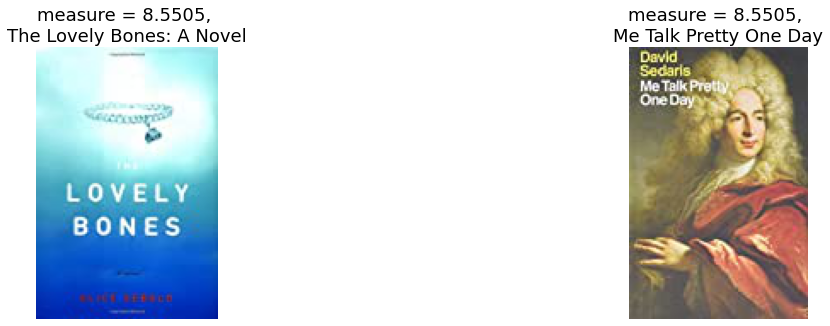

In [45]:
col.I2I(3461)   

### U2I рекомендации 

Для товаров


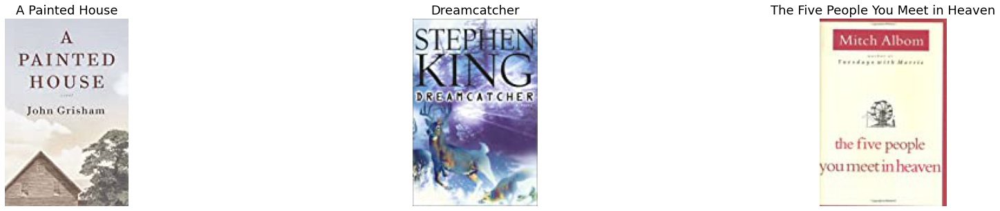

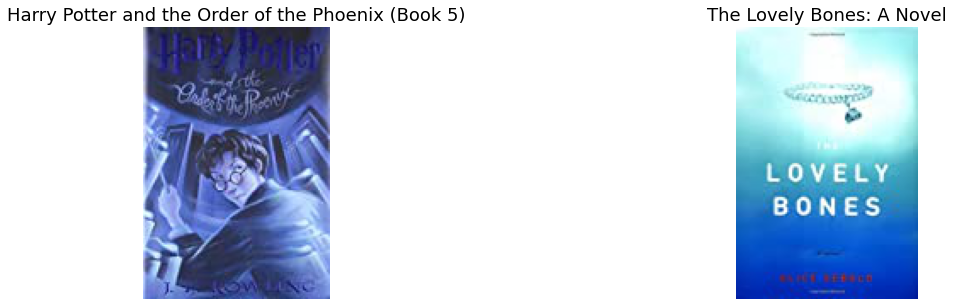

Такие рекомендации


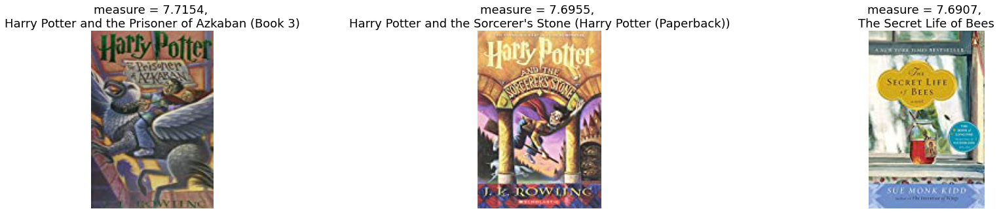

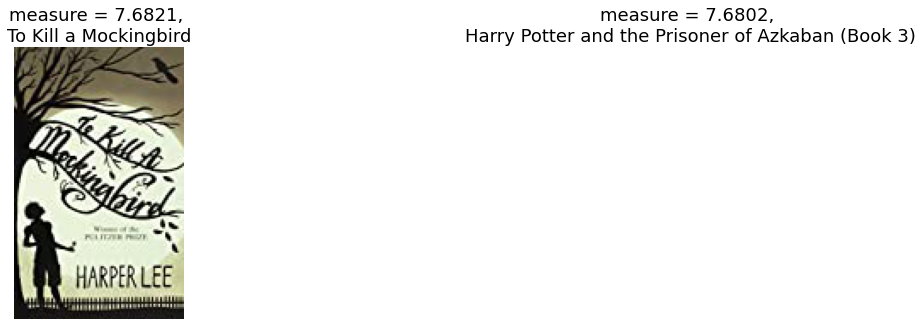

In [46]:
col.U2I(3012)

Для товаров


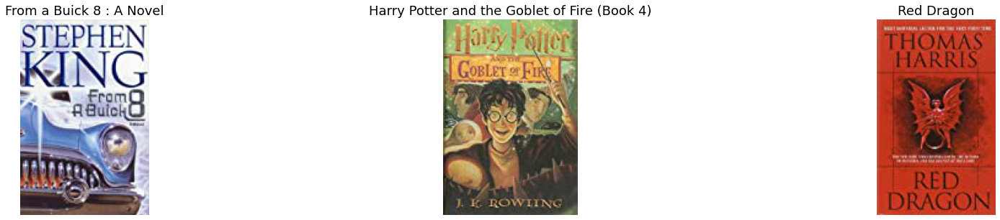

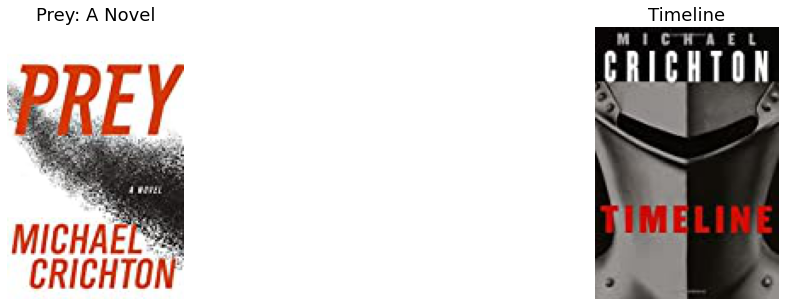

Такие рекомендации


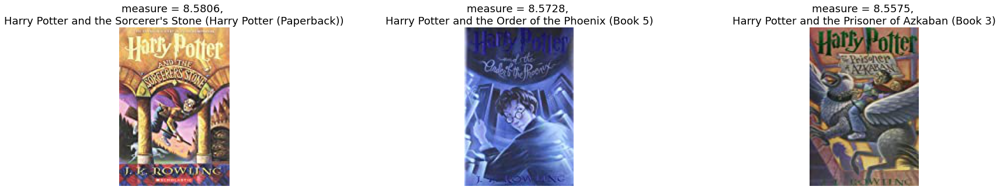

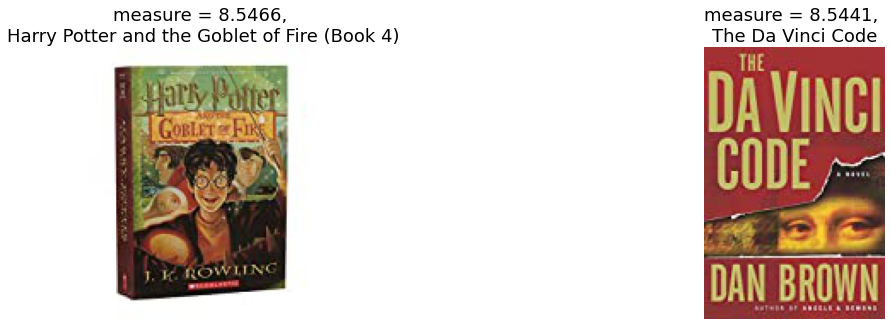

In [47]:
col.U2I(4234)

Для товаров


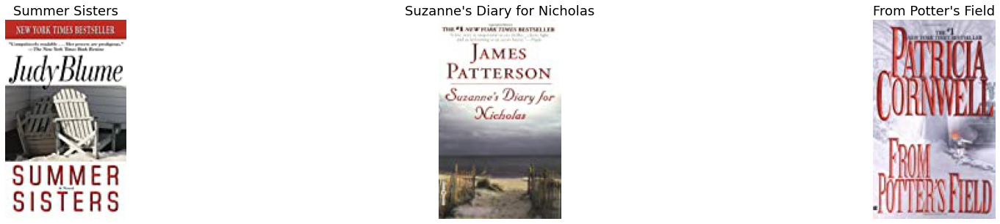

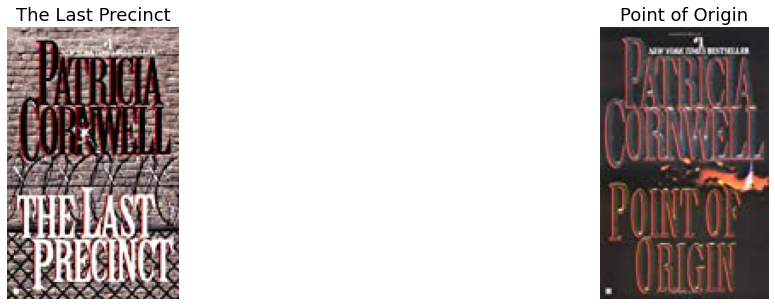

Такие рекомендации


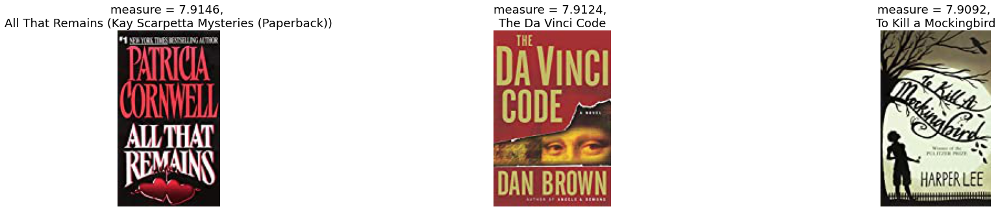

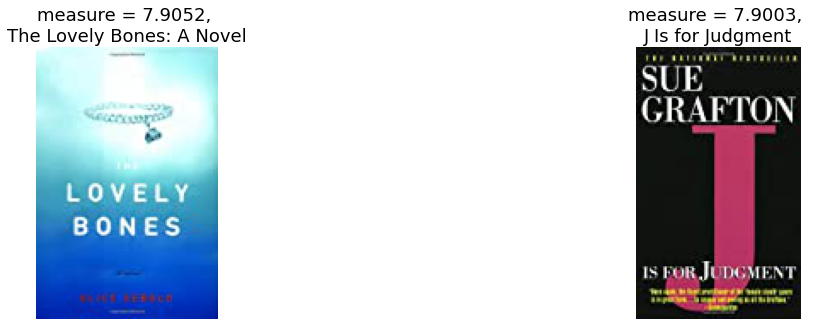

In [48]:
col.U2I(5325)

Полученные рекомендации менее очевидные, хотя есть и рекомендации типа Гарри Поттеру Гарри Поттера и Кингу Кинга.

# Matrix Factorization

Основная идея следующая. Исходную матрицу взаимодействий можно разложить на произведение двух матриц. Тогда первая матрица будет являться признаковым описанием юзеров, а вторая матрица - признаковым описанием книг.  
При I2I подходе можно найти признаковое описание книги в новой матрице и искать рекомендации по похожим к этому описанию книгам (через метрику схожести).   
U2I Будем реализовывать с помощью predict LightFM. То есть фактически перемножать матрицу юзеров и матрицу пользователей и получать приближения рейтингов. Далее сортировать рейтинги и получать рекомендацию.

In [49]:
class MatrixFactorization():
    
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
            
        self.k = k
        self.interactions = Int
        
        csr_rates = coo_matrix((interactions["Book-Rating"], (interactions["vid"], interactions["product_id"])), 
                            shape=(len(set(interactions["vid"])), len(set(interactions["product_id"]))))
        
        self.csr_rates = csr_rates
        
        
    def LightFM(self):
        self.model = LightFM(loss='warp', no_components=100, learning_rate=0.01
                             , learning_schedule="adadelta", k = 30)
        self.model.fit(self.csr_rates, epochs=500, num_threads=2)
        self.user_feature_bias, self.user_embs = self.model.get_user_representations() # матрица пользователей
        self.item_feature_bias, self.items_embs = self.model.get_item_representations() # матрица книг
    def I2I(self, i_id):
        sim = cosine_similarity([self.items_embs[i_id]], self.items_embs)
        print(u"Для товара")
        rec_imaging([i_id], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-sim)[0][1:5], self.product_id_to_url, -np.round(np.sort(-sim)[0][1:5], 4))
        
    def U2I(self, u_id):
        u_rate = self.model.predict([u_id], np.arange(self.csr_rates.shape[1])) # приближаем исходную матрицу 
        u_product_Int = self.interactions[self.interactions.vid == u_id].product_id.tolist()
        for i in range(self.csr_rates.shape[0]):
            if i in u_product_Int:
                u_rate[i] = 0
        
        print(u"Для товаров")
        rec_imaging([book for book in u_product_Int[:5]], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging([book for book in np.argsort(u_rate)[::-1][:5]], self.product_id_to_url)

In [ ]:
Fact = MatrixFactorization(interactions)
Fact.LightFM()

### I2I рекомендации

In [ ]:
Fact.I2I(7216) 

In [ ]:
Fact.I2I(3461)

In [ ]:
Fact.I2I(7174)

### U2I рекомендации

In [ ]:
Fact.U2I(2676)

In [ ]:
Fact.U2I(3012)

In [ ]:
Fact.U2I(4234)

Полученные рекомендации также не очевидные.

## Выводы  
Таким образом, были реализваны разные подходы к построению рекомендательных систем.  
Наиболее интересными кажутся Colloborative filtering и Matrix Factorization. Рекомендации данных систем менее очевидные, однако нельзя также однозначно сказать о том понравятся ли все они пользователю.
